In [ ]:
import torchvision
import torch
import numpy as np
from PIL import Image
from torchvision import transforms as T
import cv2
import matplotlib.pyplot as plt

In [ ]:
device="cuda" if torch.cuda.is_available() else "cpu"
device

'cuda'

##1.Load Model

In [ ]:
model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True).eval()

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=FasterRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=FasterRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth
100%|██████████| 160M/160M [00:01<00:00, 120MB/s]


In [ ]:
COCO_INSTANCE_CATEGORY_NAMES = ['__background__', 'person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus', 'train', 'truck',
                                'boat', 'traffic light', 'fire hydrant', 'N/A', 'stop sign', 'parking meter', 'bench', 'bird',
                                'cat', 'dog', 'horse', 'sheep', 'cow', 'elephant', 'bear', 'zebra', 'giraffe', 'N/A', 'backpack',
                                'umbrella', 'N/A', 'N/A', 'handbag', 'tie', 'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball',
                                'kite', 'baseball bat', 'baseball glove', 'skateboard', 'surfboard', 'tennis racket', 'bottle', 'N/A',
                                'wine glass', 'cup', 'fork', 'knife', 'spoon', 'bowl', 'banana', 'apple', 'sandwich', 'orange', 'broccoli',
                                'carrot', 'hot dog', 'pizza', 'donut', 'cake', 'chair', 'couch', 'potted plant', 'bed', 'N/A',
                                'dining table', 'N/A', 'N/A', 'toilet', 'N/A', 'tv', 'laptop', 'mouse', 'remote', 'keyboard',
                                'cell phone', 'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'N/A', 'book', 'clock', 'vase',
                                'scissors', 'teddy bear', 'hair drier', 'toothbrush']

##2.prediction

In [ ]:
def get_prediction(img_path, threshold):
  #read image
  img = Image.open(img_path)
  #transform
  transform = T.Compose([T.ToTensor()])
  img = transform(img)
  #img = img.to(device)
  #prediction
  pred = model([img])
  #Class, box coordinates are obtained but only prediction score > threshold
  pred_class = [COCO_INSTANCE_CATEGORY_NAMES[i] for i in list(pred[0]['labels'].numpy())]
  pred_boxes = [[(i[0], i[1]),(i[2],i[3])] for i in list(pred[0]['boxes'].detach().numpy())]
  pred_score = list(pred[0]['scores'].detach().numpy())
  pred_t = [pred_score.index(x) for x in pred_score if x>threshold][-1]
  pred_boxes = pred_boxes[:pred_t+1]
  pred_class = pred_class[:pred_t+1]

  return pred_boxes,pred_class

##3.object detection

In [ ]:
def object_detection_api(img_path, threshold=0.5, rect_th=3, text_size=1.5, text_th=3):

  boxes, pred_cls = get_prediction(img_path, threshold) # Get predictions
  img = cv2.imread(img_path) # Read image with cv2
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) # Convert to RGB
  for i in range(len(boxes)):
    box = boxes[i]
    y1, x1 = int(box[0][1]), int(box[0][0])
    y2, x2 = int(box[1][1]), int(box[1][0])
    pt1 = (x1, y1)
    pt2 = (x2, y2)
    cv2.rectangle(img,pt1,pt2,color=(0, 255, 0), thickness=rect_th) # Draw Rectangle with the coordinates
    cv2.putText(img,pred_cls[i], pt1,  cv2.FONT_HERSHEY_SIMPLEX, text_size, (0,255,0),thickness=text_th) # Write the prediction class
  plt.figure(figsize=(15,20)) # display the output image
  plt.imshow(img)
  plt.xticks([])
  plt.yticks([])
  plt.show()

##4.output

In [ ]:
!wget https://www.wsha.org/wp-content/uploads/banner-diverse-group-of-people-2.jpg -O people.jpg


--2023-07-08 13:02:06--  https://www.wsha.org/wp-content/uploads/banner-diverse-group-of-people-2.jpg
Resolving www.wsha.org (www.wsha.org)... 141.193.213.10, 141.193.213.11
Connecting to www.wsha.org (www.wsha.org)|141.193.213.10|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1923610 (1.8M) [image/jpeg]
Saving to: ‘people.jpg’

people.jpg          100%[===================>]   1.83M  2.24MB/s    in 0.8s    

2023-07-08 13:02:08 (2.24 MB/s) - ‘people.jpg’ saved [1923610/1923610]



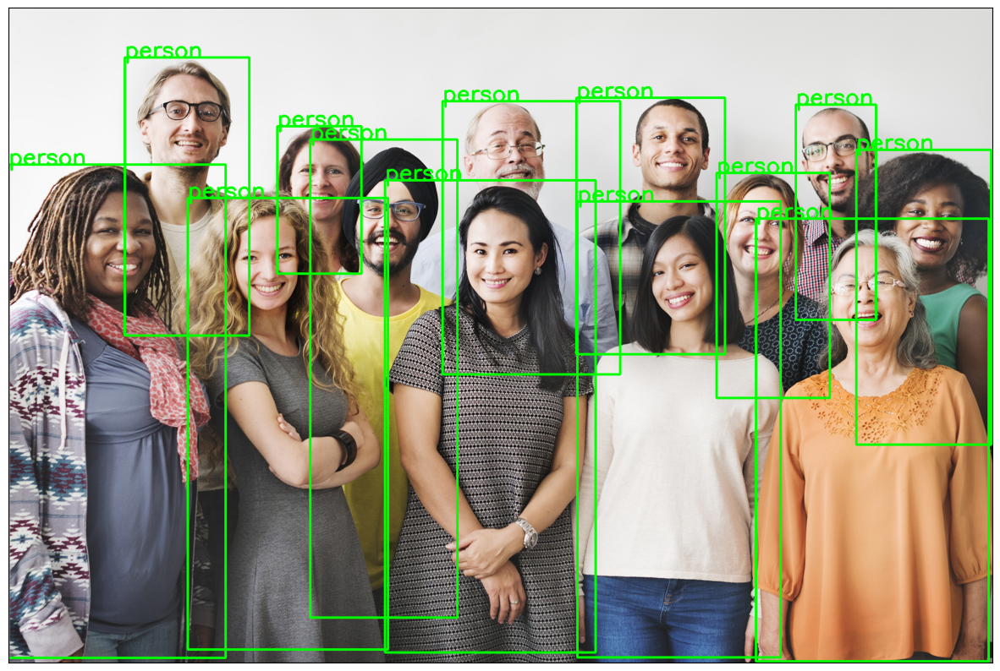

In [ ]:
object_detection_api('people.jpg',threshold=0.8)

--2023-07-08 12:11:39--  https://hips.hearstapps.com/hmg-prod.s3.amazonaws.com/images/10best-cars-group-cropped-1542126037.jpg
Resolving hips.hearstapps.com (hips.hearstapps.com)... 151.101.0.155, 151.101.64.155, 151.101.128.155, ...
Connecting to hips.hearstapps.com (hips.hearstapps.com)|151.101.0.155|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2178423 (2.1M) [image/jpeg]
Saving to: ‘car.jpg’

car.jpg             100%[===================>]   2.08M  --.-KB/s    in 0.07s   

2023-07-08 12:11:40 (29.7 MB/s) - ‘car.jpg’ saved [2178423/2178423]



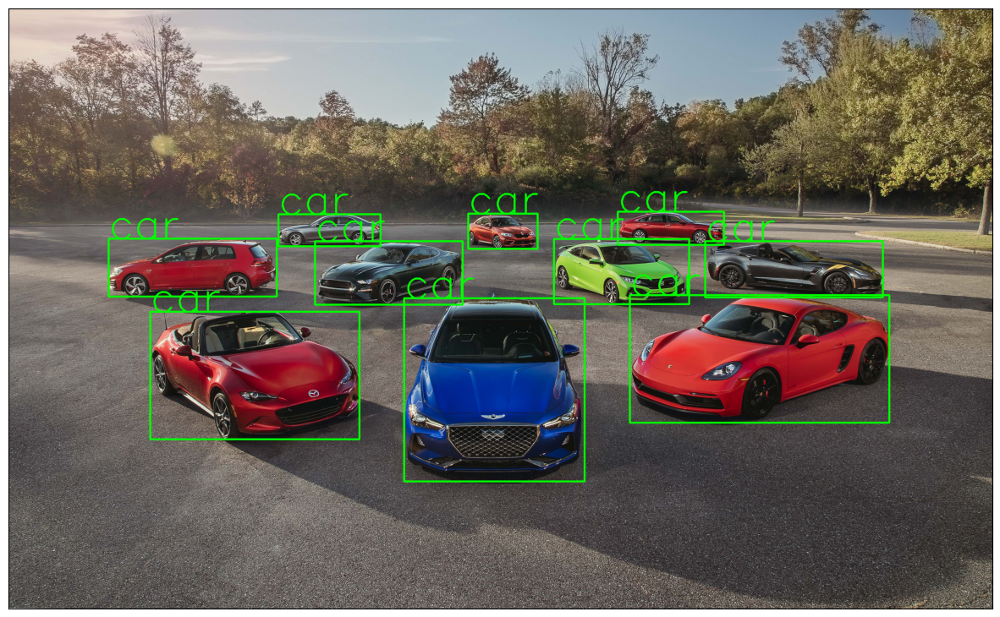

In [ ]:
!wget https://hips.hearstapps.com/hmg-prod.s3.amazonaws.com/images/10best-cars-group-cropped-1542126037.jpg -O car.jpg
object_detection_api('./car.jpg', rect_th=6, text_th=5, text_size=5)


--2023-07-08 12:12:02--  https://cdn.pixabay.com/photo/2013/07/05/01/08/traffic-143391_960_720.jpg
Resolving cdn.pixabay.com (cdn.pixabay.com)... 104.18.14.16, 104.18.15.16, 2606:4700::6812:e10, ...
Connecting to cdn.pixabay.com (cdn.pixabay.com)|104.18.14.16|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 259865 (254K) [binary/octet-stream]
Saving to: ‘traffic.jpg’

traffic.jpg         100%[===================>] 253.77K  --.-KB/s    in 0.04s   

2023-07-08 12:12:03 (6.06 MB/s) - ‘traffic.jpg’ saved [259865/259865]



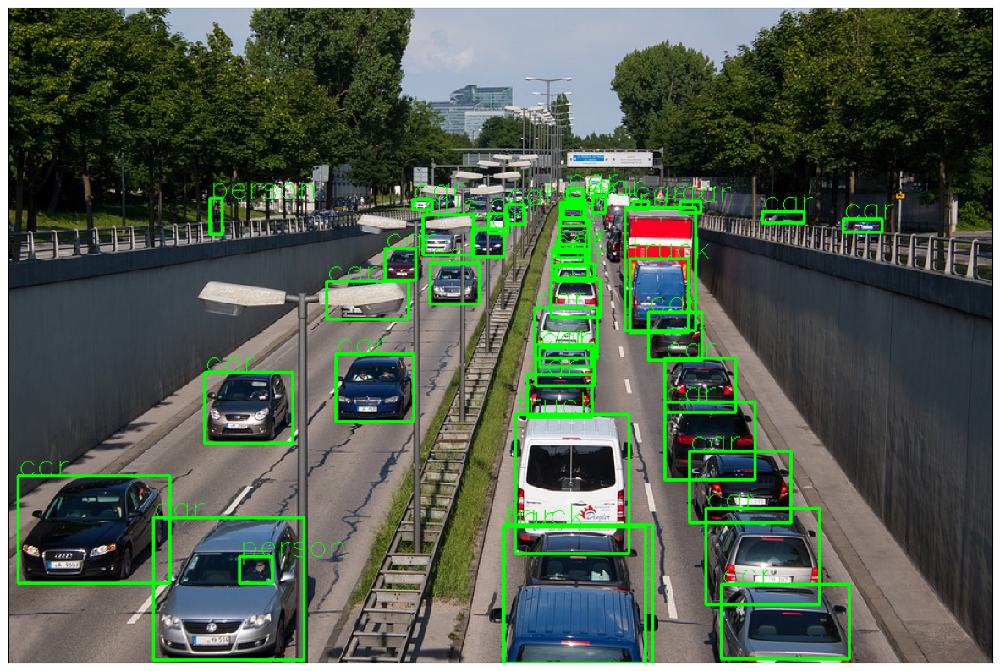

In [ ]:
!wget https://cdn.pixabay.com/photo/2013/07/05/01/08/traffic-143391_960_720.jpg -O traffic.jpg
%%timeit
object_detection_api('./traffic.jpg', rect_th=2, text_th=1, text_size=1)


In [ ]:
!wget https://images.unsplash.com/photo-1458169495136-854e4c39548a -O girl_cars.jpg



--2023-07-08 12:14:46--  https://images.unsplash.com/photo-1458169495136-854e4c39548a
Resolving images.unsplash.com (images.unsplash.com)... 151.101.110.208, 2a04:4e42:12::720
Connecting to images.unsplash.com (images.unsplash.com)|151.101.110.208|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1221796 (1.2M) [image/jpeg]
Saving to: ‘girl_cars.jpg’

girl_cars.jpg       100%[===================>]   1.17M  6.49MB/s    in 0.2s    

2023-07-08 12:14:46 (6.49 MB/s) - ‘girl_cars.jpg’ saved [1221796/1221796]



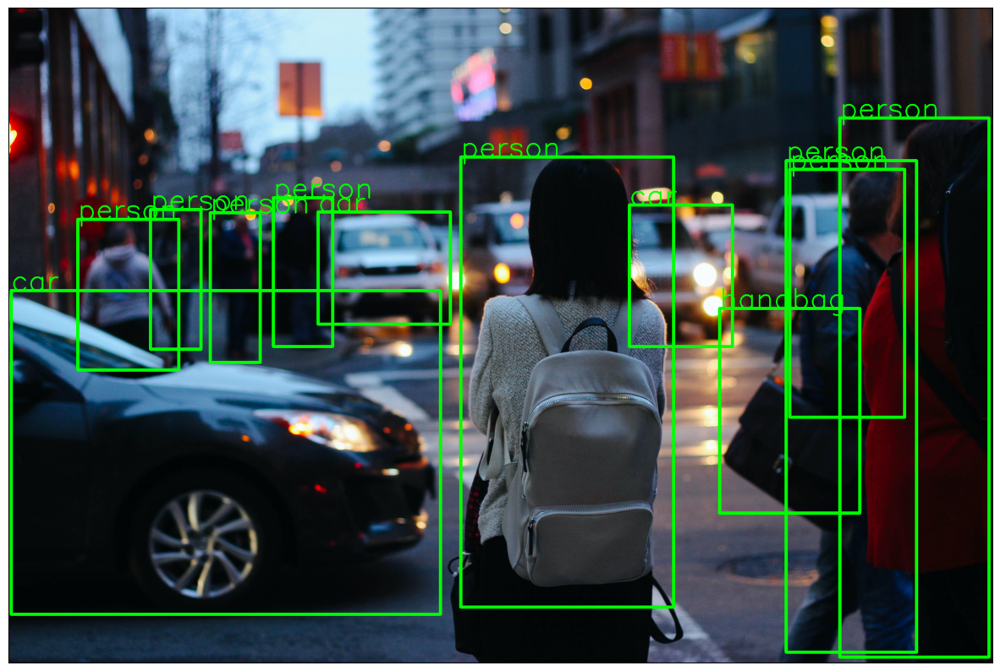

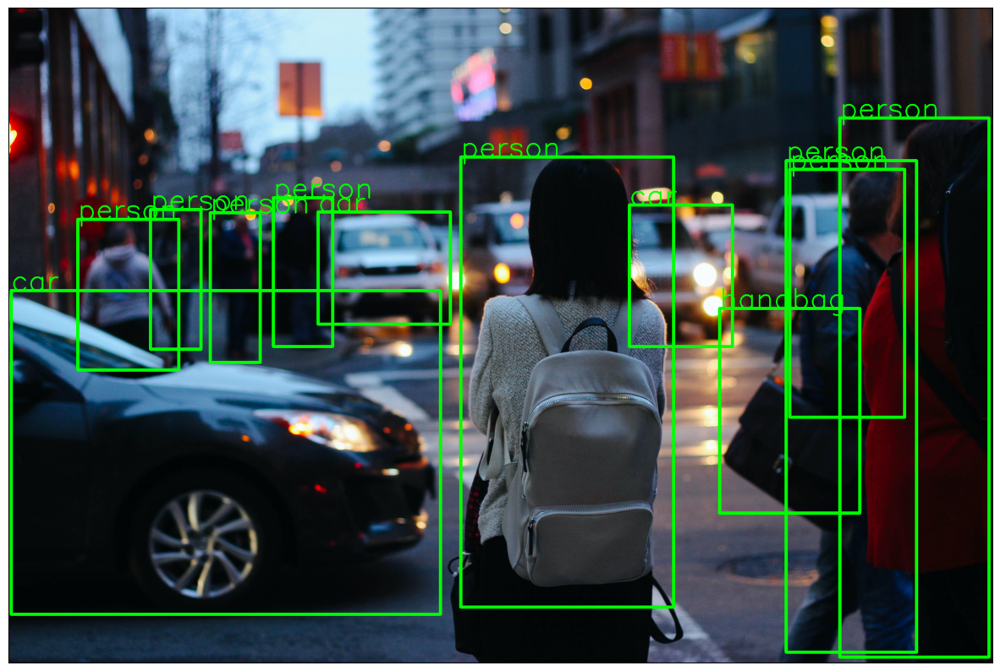

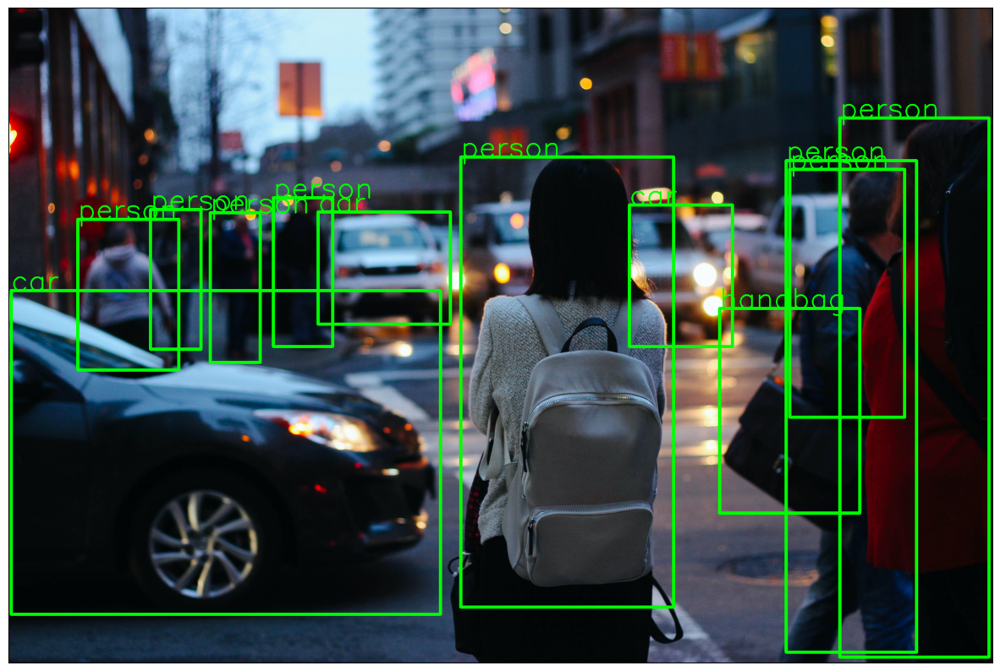

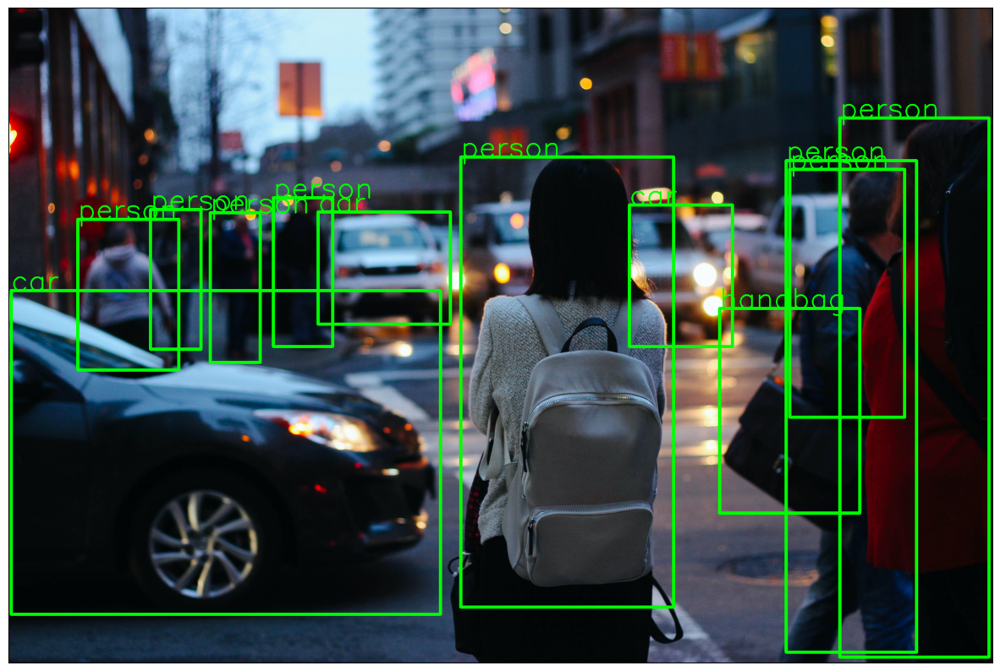

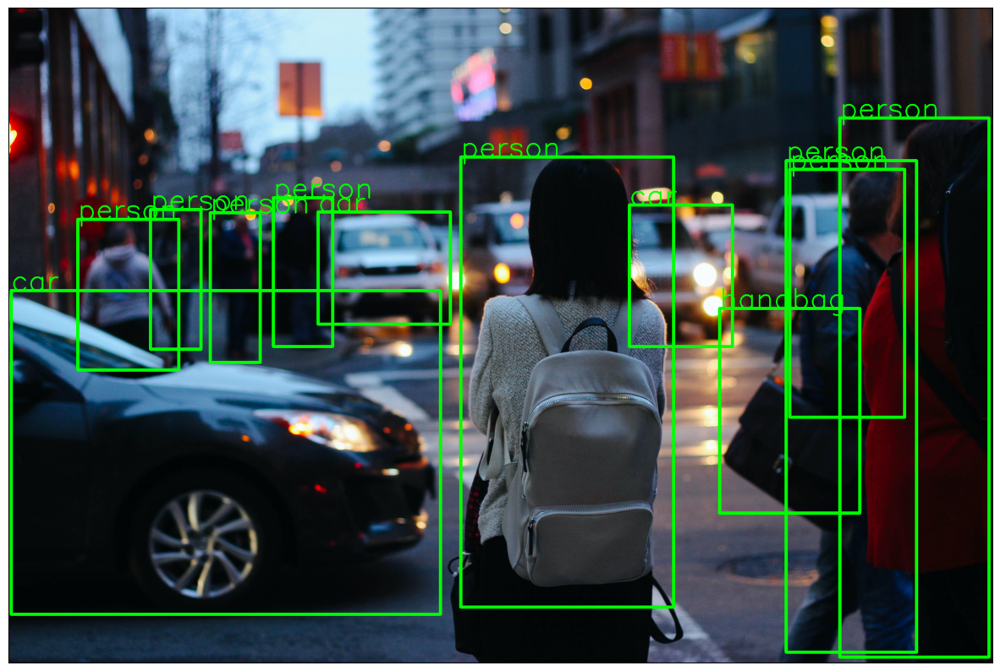

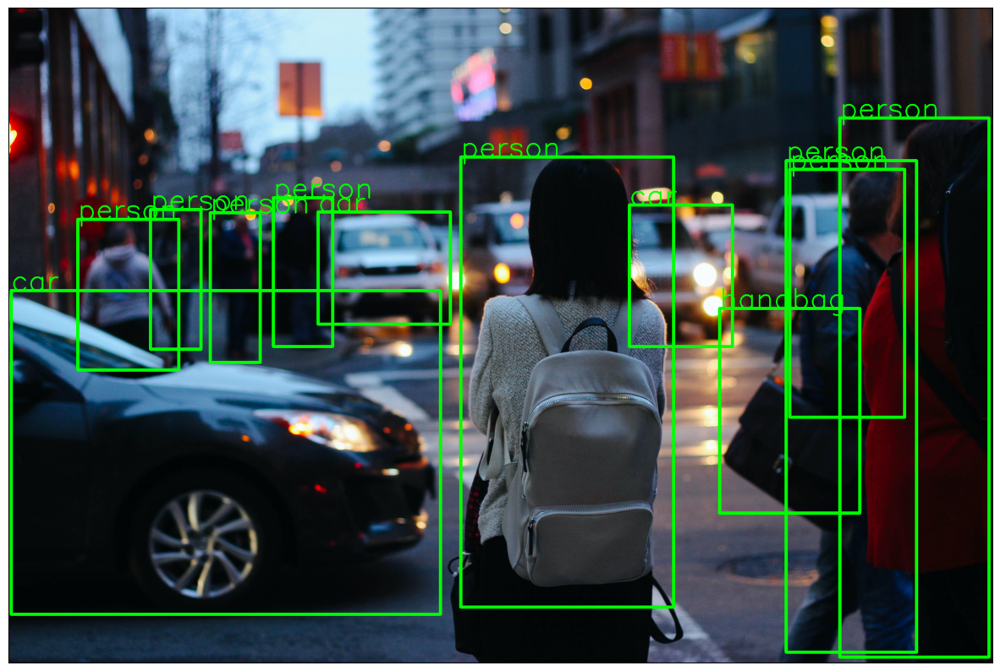

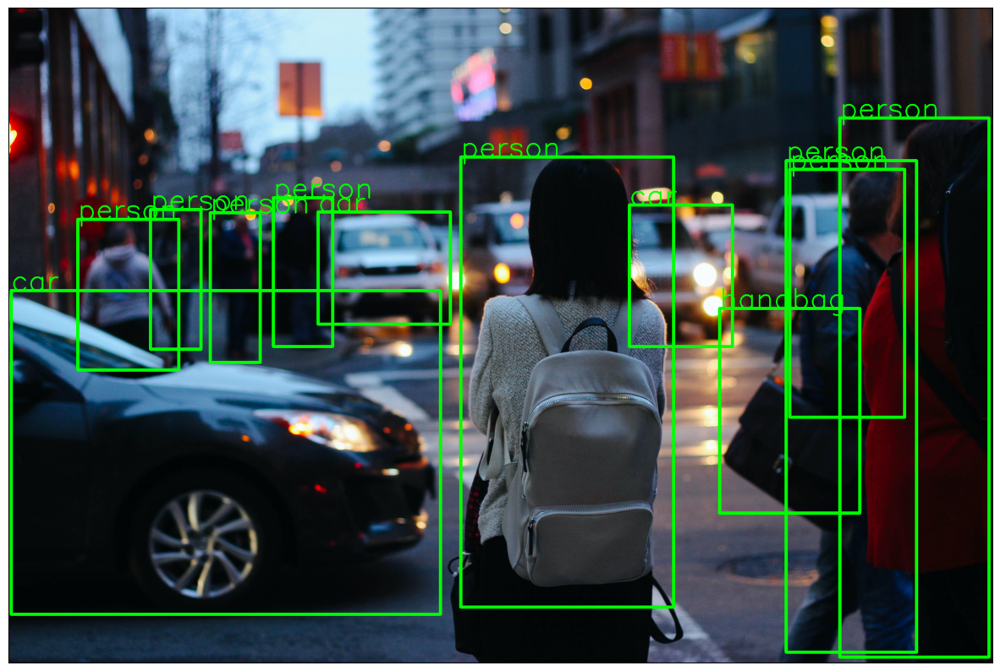

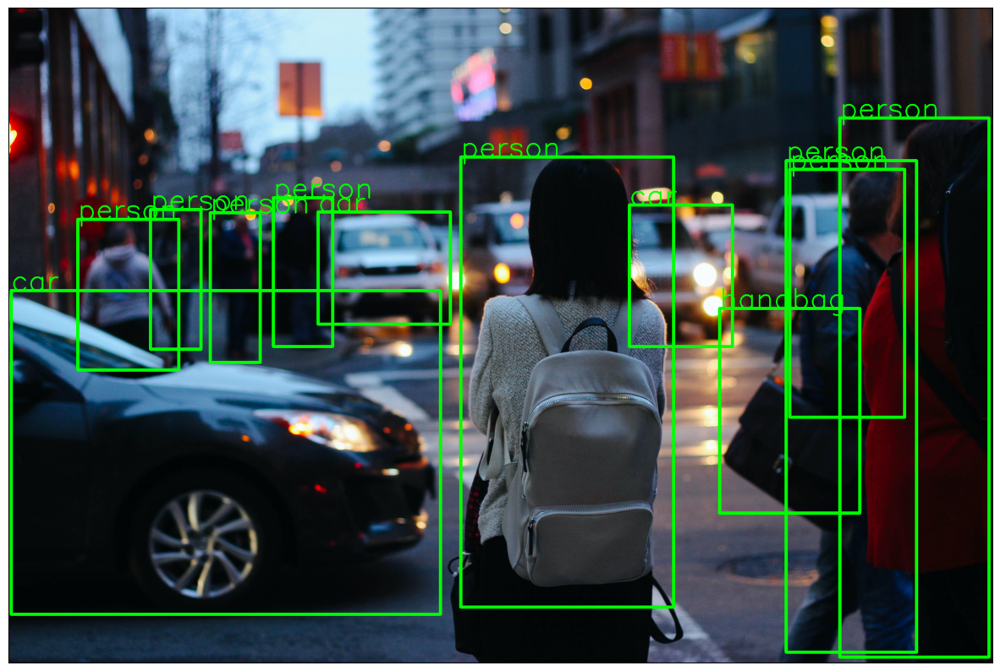

13.5 s ± 1.76 s per loop (mean ± std. dev. of 7 runs, 1 loop each)


In [ ]:
%%timeit
object_detection_api('./girl_cars.jpg', rect_th=15, text_th=7, text_size=5, threshold=0.8)



```
Models	                       CPU	     GPU
Faster R-CNN ResNet-50 FPN	8.45859 s	  0.15356 s

```



In [ ]:
device

'cuda'